In [1]:
using Markdown

In [2]:
using LaTeXStrings, DifferentialEquations, LinearAlgebra, SparseArrays

In [3]:
begin
	using Plots
	gr()
end

Plots.GRBackend()

# 2D Multiple Attractor System

_Setup vector field equations. Can't split into jump process._

In [4]:
begin
	α = 0.1
	β = 3
	n = 4
	dfx(x, y) = 9x + 9y - (1 + 2x^3 + 2y^3)
	dfy(x, y) = 1 + 2x^3 + 11y - (11x + 2y^3)
end

dfy (generic function with 1 method)

In [5]:
begin
	n_min = -3
	n_max = 3
end

3

_Compute the vector field_

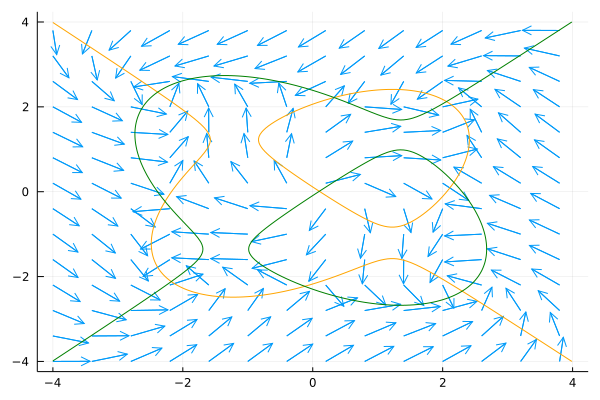

In [6]:
begin
	dq = (n_max - n_min) / 10.
	xs = n_min-1:dq:n_max+1
	ys = n_min-1:dq:n_max+1
	
	dxs = n_min-1:.05:n_max+1
	dys = n_min-1:.05:n_max+1

	df(x, y) = normalize([dfx(x, y), dfy(x,y)]) ./ 1.75

	xxs = [x for x in xs for y in ys]
	yys = [y for x in xs for y in ys]

	quiver(xxs, yys, quiver=df)
	contour!(dxs, dys, dfx, levels=[0], color=:orange, label="X Nullcline", colorbar = false)
	p1 = contour!(dxs, dys, dfy, levels=[0], color=:green, label = "Y Nullcline", colorbar = false)
	p1
end

_Setup the Stochastic Differential Equation model with diagonal noise_

In [7]:
function f(du, u, p, t)
	du[1] = dfx(u...)
	du[2] = dfy(u...)
	du[1], du[2]
end

f (generic function with 1 method)

In [8]:
begin
	g(du, u, p, t) = begin
	  du[1] = 1.25
	  du[2] = 1.25
	end
	sde_prob= SDEProblem(f, g, [0., 0.], (0.0, 1000.0))
	sde_sol = solve(sde_prob, SRIW1())
end

retcode: Success
Interpolation: 1st order linear
t: 102399-element Vector{Float64}:
    0.0
    3.6514837167011073e-6
    7.759402897989854e-6
    1.2380811976939694e-5
    1.7579897190758263e-5
    2.3428868056304155e-5
    3.0008960280043283e-5
    3.7411564031749804e-5
    4.573949325241964e-5
    5.5108413625673204e-5
    6.564844904558346e-5
    7.750598889298251e-5
    9.084572122130643e-5
    ⋮
  999.9273990038436
  999.9327073681966
  999.9386792780938
  999.9453976767281
  999.9520086655147
  999.9594460278995
  999.9678130605824
  999.9753767113151
  999.9838858183894
  999.9918832268087
  999.9991628329426
 1000.0
u: 102399-element Vector{Vector{Float64}}:
 [0.0, 0.0]
 [-0.0003741681687235294, 0.0024860957421516724]
 [-9.830430075056926e-5, 0.0015009224897204894]
 [9.876643964970858e-5, 0.002018191652676208]
 [0.0025328542898177923, 0.006282886463371841]
 [0.004738240631971388, 0.005149982367181946]
 [0.0038682082140360854, 0.0012974430835765412]
 [0.003942582826542919, 0.00

In [9]:
pstoch_1 = plot(sde_sol,title="Stochastic Simulation", labels=[L"x" L"y"])

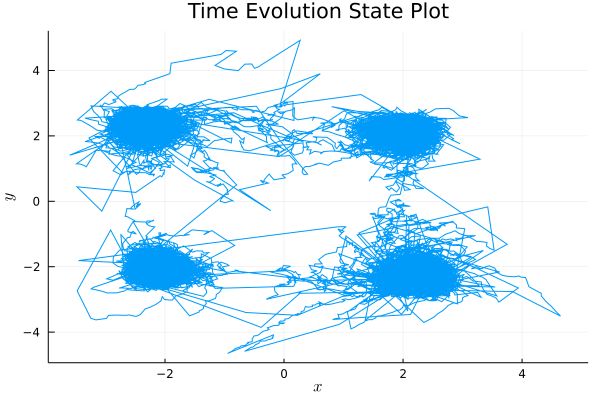

In [10]:
pstoch_2 = plot(sde_sol[1000:end], vars = [(1,2)], label="", xlabel=L"x", ylabel = L"y", title="Time Evolution State Plot")

In [11]:
# pstoch = plot(pstoch_1, pstoch_2, layout=(1, 2), size=(900, 350))

In [12]:
# savefig(pstoch, "ch3_four_attractor_stoch.pdf")

_Helper function to tip towards different quadrants for each run of the simulation_

In [13]:
function get_u0(i)
	offset = 1.0
	new_u0 = [0.0, 0.0]
	if i % 4 == 0
		new_u0 .+= [offset, offset]
	elseif i % 4 == 1
		new_u0 .+= [-1* offset, offset]
	elseif i % 4 == 2
		new_u0 .+= [-1* offset, -1* offset]
	else
		new_u0 .+= [offset,-1* offset]
	end
	new_u0
end

get_u0 (generic function with 1 method)

_Add smaller noise term for longer time simulation._

In [14]:
begin 
	g2(du, u, p, t) = begin
	  du[1] = 0.5
	  du[2] = 0.5
	end
end

g2 (generic function with 1 method)

_Helper to compute the 2D histograms for unnomalized probability_

In [15]:
begin
	nbins = 257
	bin_min = -10.
	bin_max = 10.
	xbins = range(bin_min, bin_max, length=nbins)
	ybins = range(bin_min, bin_max, length=nbins)
	xbins
	
	function bucket_idx(val, vec)
		idx = 1
		while val > vec[idx]
			idx += 1
		end
		idx - 1 
	end
	
	function althist(x, y, dt, xedges, yedges) 
	   counts = spzeros(length(xedges)-1, length(yedges)-1)

		for i=1:length(x) - 1
			r = bucket_idx(x[i], yedges)
			c = bucket_idx(y[i], xedges)
			counts[r,c] += dt[i]
		end

 		counts
	end

	drop_num = 2000
end

2000

In [16]:
unnorm = spzeros(length(xbins)-1, length(ybins)-1)

256×256 SparseMatrixCSC{Float64, Int64} with 0 stored entries:
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀

_Rerun the following cell to add more data points to the simulation._

In [17]:
begin
	for i in 1:4*100
		u00 = get_u0(i)
		sde_prob_long = SDEProblem(f, g2, u00, (0.0, 1e3))
		sde_sol_long= solve(sde_prob_long, SRIW1())
		unnorm .+= althist(sde_sol_long[1, drop_num:end], sde_sol_long[2, drop_num:end], diff(sde_sol_long.t[drop_num:end]), xbins, ybins)
	end
	unnorm
end

256×256 SparseMatrixCSC{Float64, Int64} with 4391 stored entries:
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⡤⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⢰⣾⣾⣿⡅⣔⣀⠀⣠⣰⣷⣮⣴⣥⣀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⢀⣽⣿⣿⣿⣿⣿⣿⣷⣯⣿⣿⣿⣿⣿⠺⡓⠤⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⢴⢿⣿⣿⣿⣿⣻⡿⢟⠻⣿⣿⣿⣿⢿⠠⠚⠂⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠳⡌⣌⢛⣿⠟⠃⠈⠀⠀⠀⠚⣻⣿⡏⠂⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠘⢦⣯⣷⣷⣤⡀⠀⣀⡐⣤⣼⣿⣷⡄⡂⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⢠⣼⣿⣿⣿⣿⣯⣭⣿⣿⣿⣿⣿⣿⡿⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠨⣿⣿⣿⣿⣿⣿⡟⠟⣿⣿⣿⣿⣿⡟⠂⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠒⠩⣻⢟⡟⠋⠃⠀⠀⠁⠀⠙⠘⠛⠃⠁⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠊⠁⠈⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀

_Normalized and visualize the probability and resulting Quasi-potential._

In [18]:
prob = unnorm ./ sum(unnorm)

256×256 SparseMatrixCSC{Float64, Int64} with 4391 stored entries:
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⡤⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⢰⣾⣾⣿⡅⣔⣀⠀⣠⣰⣷⣮⣴⣥⣀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⢀⣽⣿⣿⣿⣿⣿⣿⣷⣯⣿⣿⣿⣿⣿⠺⡓⠤⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⢴⢿⣿⣿⣿⣿⣻⡿⢟⠻⣿⣿⣿⣿⢿⠠⠚⠂⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠳⡌⣌⢛⣿⠟⠃⠈⠀⠀⠀⠚⣻⣿⡏⠂⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠘⢦⣯⣷⣷⣤⡀⠀⣀⡐⣤⣼⣿⣷⡄⡂⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⢠⣼⣿⣿⣿⣿⣯⣭⣿⣿⣿⣿⣿⣿⡿⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠨⣿⣿⣿⣿⣿⣿⡟⠟⣿⣿⣿⣿⣿⡟⠂⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠒⠩⣻⢟⡟⠋⠃⠀⠀⠁⠀⠙⠘⠛⠃⠁⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠊⠁⠈⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀

In [19]:
begin
	plotly()
	p = surface(- log.(prob))
	gr()
	p
end

┌ Info: For saving to png with the Plotly backend PlotlyBase has to be installed.
└ @ Plots /Users/bsm/.julia/packages/Plots/lzHOt/src/backends.jl:372


<!DOCTYPE html>
 
 
 Plots.jl

In [20]:
begin
	plotly()
	pp = surface(xbins, ybins,prob,c = :grayC)
	gr()
	pp
end

<!DOCTYPE html>
 
 
 Plots.jl

In [21]:
begin
	xplot = range(bin_min, bin_max, length=nbins-1)
	yplot = range(bin_min, bin_max, length=nbins-1)
end

-10.0:0.0784313725490196:10.0

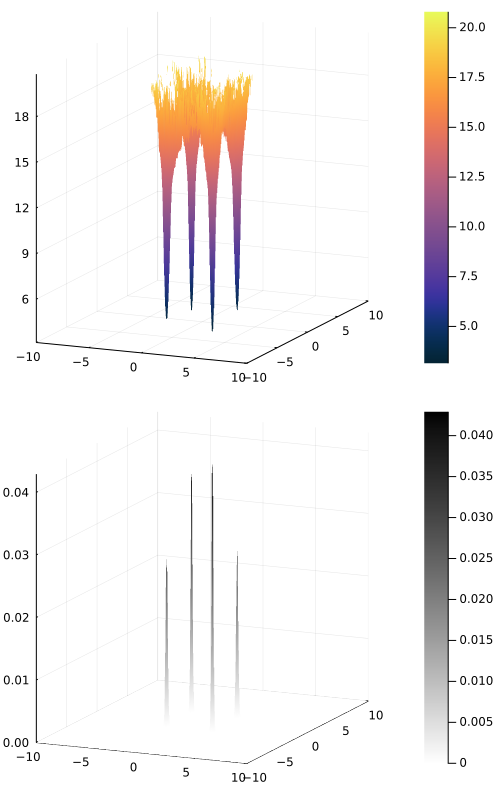

In [22]:
 begin
	pp1 = surface(xplot, yplot,-log.(prob), c = :thermal)
	pp2 =  surface(xplot, yplot, prob, c = :grayC)
	ps = plot(pp1, pp2, layout =(2, 1), size=(500, 800))
end

In [23]:
# savefig(ps, "ch3_4a_ad_hoc.pdf")

_Helper function to generate -∇ ² to solve the Helmhotz equation_

In [24]:
begin
	import DiffEqOperators
	const DiffEqOp = DiffEqOperators

	eye(N, M) = sparse(I, N, M)
	eye(M) = eye(M, M)
	diff1(M) = [ [1.0 zeros(1, M - 1)]; diagm(1 => ones(M - 1)) - eye(M) ]
	sdiff1(M) = sparse(diff1(M))
	flatshape(X) = reshape(X, length(X))


	# make the discrete -Laplacian in 2d, with Dirichlet boundaries
	function laplacian2d(Nx, Ny, Lx, Ly)
		dx = Lx / (Nx + 1)
		dy = Ly / (Ny + 1)
		Dx = sdiff1(Nx) / dx
		Dy = sdiff1(Ny) / dy
		Ax = Dx' * Dx
		Ay = Dy' * Dy
		return Dx, Dy, kron(eye(Ny), Ax) + kron(Ay, eye(Nx))
	end
end

laplacian2d (generic function with 1 method)

In [25]:
# fg =  plot(p1, p2, p3, layout=(3,1), size=(750, 2250))

In [26]:
# savefig(fg, "ch3_four_attractor.pdf")

### Appendix: Helper decomposition functions

In [27]:
## We are trying to solve the following equation 
## ∇²Uᴴ (x⃗) = -∇ ⋅ F(x⃗)
## We are starting in 2 dimensions
function helmholtz(prob::DiscreteProblem, minval::Int64, maxval::Int64, nsample::Int64) 
    dx = (maxval - minval) / (nsample + 1)
    dy = (maxval - minval) / (nsample + 1)
    xs = range(minval, maxval, length=nsample)
    ys = range(minval, maxval, length=nsample)
    ∂x(x, y) = prob.f.f([0.0, 0.0], [x, y], prob.p, nothing)[1]
    ∂y(x, y) = prob.f.f([0.0, 0.0], [x, y], prob.p, nothing)[2]
    # Let's first construct F = [f1, f2]
    f1 = [∂x(x, y) for x in xs, y in ys]
    f2 = [∂y(x, y) for x in xs, y in ys]
    _, _, Δ = laplacian2d(nsample, nsample, maxval - minval, maxval - minval)

    Dx = DiffEqOp.CenteredDifference{1}(1, 2, dx, nsample)
    Dy = DiffEqOp.CenteredDifference{2}(1, 2, dy, nsample)

    bcx = DiffEqOp.Dirichlet0BC{1}(eltype(f1), size(f1))
    bcy = DiffEqOp.Dirichlet0BC{2}(eltype(f2), size(f2))

    rhs =  Dx * bcx * f1 + Dy * bcy *  f2
    
    u = Δ \ flatshape(rhs)
    xs, ys, reshape(u, size(rhs)...)
end

helmholtz (generic function with 1 method)

In [28]:
begin
	nsample = 512
	dprob = DiscreteProblem(f, [0.0,0.0], (0, 100.), nothing)
	x, y, u_h = helmholtz(dprob, -3, 3, nsample)
end

(-3.0:0.011741682974559686:3.0, -3.0:0.011741682974559686:3.0, [0.1294998777831836 0.16243703338537016 … 0.016737557349006546 0.08870109675618942; 0.04578652079205767 0.055757946469432204 … 0.01523251027988149 0.11016221774968435; … ; 0.12185773514106535 0.026927638629895403 … 0.055757946469432114 0.04116306520425123; 0.1003968086682542 0.02843307474038758 … 0.1670604889731765 0.12949987778318356])

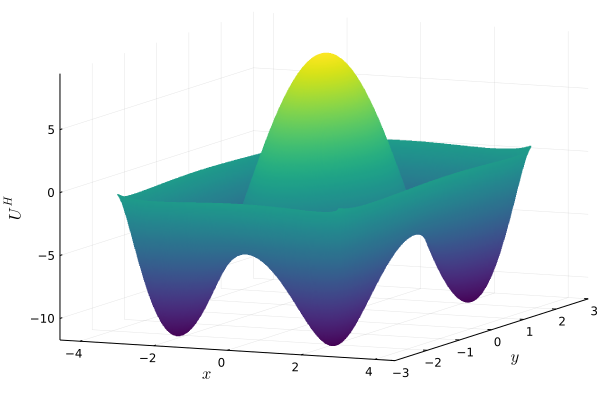

In [29]:
begin
	gr()
	fg = surface(x, y, u_h, colorbar=:none,  c=:viridis, aspect_ratio=:equal, xlabel=L"x", ylabel=L"y", zlabel=L"U^H")
end

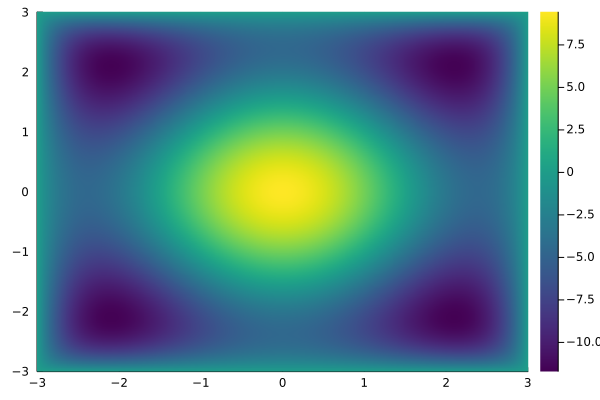

In [30]:
p3 = heatmap(x, y, u_h, c=:viridis)

In [31]:

function make_inplace(f::Function)
    function inplace_f(out, x)
        out .= f(x)
    end
    return inplace_f
end


make_inplace (generic function with 1 method)

In [32]:
function normal(prob::DiscreteProblem, minval::Int64, maxval::Int64, nsample::Int64, u0::Matrix{Float64})
    dx = (maxval - minval) / (nsample + 1)
    dy = (maxval - minval) / (nsample + 1)

    xs = range(minval, maxval, length=nsample)
    ys = range(minval, maxval, length=nsample)
    ∂x(x, y) = prob.f.f([0.0, 0.0], [x, y], prob.p, nothing)[1]
    ∂y(x, y) = prob.f.f([0.0, 0.0], [x, y], prob.p, nothing)[2]
    
    f1 = [∂x(x, y) for x in xs, y in ys]
    f2 = [∂y(x, y) for x in xs, y in ys]
    
    Dx = DiffEqOp.UpwindDifference{1}(1, 2, dx, nsample, 1)
    Dy = DiffEqOp.UpwindDifference{2}(1, 2, dy, nsample, 1)

    bcx = DiffEqOp.Dirichlet0BC{1}(eltype(u0), size(u0))
    bcy = DiffEqOp.Dirichlet0BC{2}(eltype(u0), size(u0))

    function find_my_zero(u)
        dudx = Dx * bcx * u
        dudy = Dy * bcy * u
        return dot(dudx, f1 .+ dudx) + dot(dudy, f2 .+ dudy)
    end

    fmz! = make_inplace(find_my_zero)

    sol = nlsolve(fmz!, u0, show_trace=true, iterations=3000)
    sol.zero
end


normal (generic function with 1 method)